##**2.1 Acquire, Clean, and Preprocess Data**

(a) Data Acquisition
- Identify your data source: file-based (CSV, JSON), database, API, etc.
- Document how you obtained it. For example, if from an API, show the request.

In [ ]:
# !pip install kagglehub

In [ ]:
!ls

sample_data


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split


In [ ]:
import kagglehub
from kagglehub import KaggleDatasetAdapter
import pandas as pd
import os
# Download latest version
# file_path = kagglehub.dataset_download("kanchana1990/adzuna-global-job-listings-2025")
file_path = kagglehub.dataset_download("abdallaahmed77/healthcare-risk-factors-dataset")

print("Path to dataset files:", file_path)
# !ls {file_path}

Using Colab cache for faster access to the 'healthcare-risk-factors-dataset' dataset.
Path to dataset files: /kaggle/input/healthcare-risk-factors-dataset


##Check if file id loaded correctly.

In [ ]:
# csv_path = os.path.join(file_path, "adzuna_global_job_listings_2025.csv")
csv_path = os.path.join(file_path, "dirty_v3_path.csv")
df = pd.read_csv(csv_path)
print(df.head())

    Age  Gender Medical Condition  Glucose  Blood Pressure    BMI  \
0  46.0    Male          Diabetes   137.04          135.27  28.90   
1  22.0    Male           Healthy    71.58          113.27  26.29   
2  50.0     NaN            Asthma    95.24             NaN  22.53   
3  57.0     NaN           Obesity      NaN          130.53  38.47   
4  66.0  Female      Hypertension    95.15          178.17  31.12   

   Oxygen Saturation  LengthOfStay  Cholesterol  Triglycerides  HbA1c  \
0              96.04             6       231.88         210.56   7.61   
1              97.54             2       165.57         129.41   4.91   
2              90.31             2       214.94         165.35   5.60   
3              96.60             5       197.71         182.13   6.92   
4              94.90             4       259.53         115.85   5.98   

   Smoking  Alcohol  Physical Activity  Diet Score  Family History  \
0        0        0              -0.20        3.54               0   
1     

(b) Data Cleaning
- Tasks: Handle missing values, remove duplicates, correct invalid entries.
- Python Tools: pandas methods (isnull, dropna, fillna, etc.).
- Tips: Always justify your decisions, e.g., why dropping vs. imputing missing values.

In [ ]:
#checking missing values
print("\n---Missing Data Check---")
print(df.isnull().sum())
missing_data_col = df.columns[df.isnull().sum()>0]
print(missing_data_col)


---Missing Data Check---
Age                  0
Gender               0
Medical Condition    0
Glucose              0
Blood Pressure       0
BMI                  0
Oxygen Saturation    0
LengthOfStay         0
Cholesterol          0
Triglycerides        0
HbA1c                0
Smoking              0
Alcohol              0
Physical Activity    0
Diet Score           0
Family History       0
Stress Level         0
Sleep Hours          0
random_notes         0
noise_col            0
dtype: int64
Index([], dtype='object')


In [ ]:
# 1. Check for missing values II
print("Missing values per column:")
print(df.isnull().sum())

# 2. Identify which columns actually have missing data
missing_data_col = df.columns[df.isnull().sum() > 0]
print("\nColumns with missing values:", list(missing_data_col))

# 3. Check for duplicates
print("\nAny duplicated rows?:", df.duplicated().any())

# 4. Show duplicate rows (if any)
duplicates = df[df.duplicated(keep=False)]
print("\nDuplicate rows:")
print(duplicates)

# 5. Drop rows with missing values
df = df.dropna()

# 6. Confirm it's clean
print("\nAfter cleaning:")
print(df.isnull().sum())
print("Shape after cleaning:", df.shape)

# Optional: show info about types
print("\nData types after cleaning:")
print(df.info())


Missing values per column:
Age                  4500
Gender               4500
Medical Condition    4500
Glucose              4500
Blood Pressure       4500
BMI                     0
Oxygen Saturation       0
LengthOfStay            0
Cholesterol             0
Triglycerides           0
HbA1c                   0
Smoking                 0
Alcohol                 0
Physical Activity       0
Diet Score              0
Family History          0
Stress Level            0
Sleep Hours             0
random_notes            0
noise_col               0
dtype: int64

Columns with missing values: ['Age', 'Gender', 'Medical Condition', 'Glucose', 'Blood Pressure']

Any duplicated rows?: False

Duplicate rows:
Empty DataFrame
Columns: [Age, Gender, Medical Condition, Glucose, Blood Pressure, BMI, Oxygen Saturation, LengthOfStay, Cholesterol, Triglycerides, HbA1c, Smoking, Alcohol, Physical Activity, Diet Score, Family History, Stress Level, Sleep Hours, random_notes, noise_col]
Index: []

After cleani

In [ ]:
#checking duplicates
print("\n---Duplicate Data Check---")
has_duplicates = df.duplicated().any()
print("Are there any duplicate records?", has_duplicates)

#show rows with duplicates
duplicates = df[df.duplicated(keep=False)]
print(duplicates)

#medical condition is a highly related feature, it doesn't has any pattern, imputing missing data might impact the resualt accurate.
#droping or filling missing data
df = df.dropna()
print(df.isnull().sum())


---Duplicate Data Check---
Are there any duplicate records? False
Empty DataFrame
Columns: [Age, Gender, Medical Condition, Glucose, Blood Pressure, BMI, Oxygen Saturation, LengthOfStay, Cholesterol, Triglycerides, HbA1c, Smoking, Alcohol, Physical Activity, Diet Score, Family History, Stress Level, Sleep Hours, random_notes, noise_col]
Index: []
Age                  0
Gender               0
Medical Condition    0
Glucose              0
Blood Pressure       0
BMI                  0
Oxygen Saturation    0
LengthOfStay         0
Cholesterol          0
Triglycerides        0
HbA1c                0
Smoking              0
Alcohol              0
Physical Activity    0
Diet Score           0
Family History       0
Stress Level         0
Sleep Hours          0
random_notes         0
noise_col            0
dtype: int64


(c) Data Preprocessing
- Requirement: Use at least 2 preprocessing techniques (scaling, encoding, feature engineering, etc.).
- Tips: Ensure numeric vs. categorical variables are appropriately transformed.


In [ ]:
# Choose your approach: 'tfidf' or 'count'
approach = 'tfidf'  # Change to 'count' for simple word counts

if approach == 'tfidf':
    # TF-IDF: Better for capturing important words across documents
    vectorizer = TfidfVectorizer(
        max_features=50,  # Keep top 50 most important terms
        stop_words='english',  # Remove common words
        ngram_range=(1, 2),  # Include single words and two-word phrases
        min_df=10  # Word must appear in at least 10 titles
    )
else:
    # Count Vectorizer: Simple binary or count representation
    vectorizer = CountVectorizer(
        max_features=50,
        stop_words='english',
        ngram_range=(1, 2),
        binary=True,  # Set to False for counts instead of binary
        min_df=10
    )

# Transform medical condition into features
condition_features = vectorizer.fit_transform(df['Medical Condition'].fillna(''))
condition_feature_names = vectorizer.get_feature_names_out()

# Create DataFrame with medical condition features
title_df = pd.DataFrame(
    condition_features.toarray(),
    columns=[f'condition_{name}' for name in condition_feature_names],
    index=df.index
)
print(title_df.head())

   condition_arthritis  condition_asthma  condition_cancer  \
0                  0.0               0.0               0.0   
1                  0.0               0.0               0.0   
4                  0.0               0.0               0.0   
5                  0.0               0.0               0.0   
9                  0.0               1.0               0.0   

   condition_diabetes  condition_healthy  condition_hypertension  \
0                 1.0                0.0                     0.0   
1                 0.0                1.0                     0.0   
4                 0.0                0.0                     1.0   
5                 0.0                0.0                     1.0   
9                 0.0                0.0                     0.0   

   condition_obesity  
0                0.0  
1                0.0  
4                0.0  
5                0.0  
9                0.0  


In [ ]:
df['BMI_BP_Interaction'] = df['BMI'] * df['Blood Pressure']
df['Age_Stress_Interaction'] = df['Age'] * df['Stress Level']
df['Glucose_per_BMI'] = df['Glucose'] / (df['BMI'] + 1)

df[['BMI_BP_Interaction', 'Age_Stress_Interaction', 'Glucose_per_BMI']].head()


,BMI_BP_Interaction,Age_Stress_Interaction,Glucose_per_BMI
0,3909.3030,233.22,4.583278
1,2977.8683,129.14,2.622939
4,5544.6504,421.08,2.962329
5,4351.6940,362.50,4.063806
9,3709.9712,92.17,2.996032


##**2.2 Perform Exploratory Data Analysis (EDA) and Visualize Key Insights**


 (a) Exploratory Data Analysis
- Compute basic stats (mean, median, std, etc.).
- Identify correlations, outliers, or data imbalances.
- Use pandas describe(), info(), corr() for an overview.



In [ ]:
print("---Dataset Overview---")
print(df.info())
#basic stats (mean,median,std)
print(df.describe())

print(df.select_dtypes(exclude=['object', 'string']).corr())

---Dataset Overview---
<class 'pandas.core.frame.DataFrame'>
Index: 13355 entries, 0 to 29999
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     13355 non-null  float64
 1   Gender                  13355 non-null  object 
 2   Medical Condition       13355 non-null  object 
 3   Glucose                 13355 non-null  float64
 4   Blood Pressure          13355 non-null  float64
 5   BMI                     13355 non-null  float64
 6   Oxygen Saturation       13355 non-null  float64
 7   LengthOfStay            13355 non-null  int64  
 8   Cholesterol             13355 non-null  float64
 9   Triglycerides           13355 non-null  float64
 10  HbA1c                   13355 non-null  float64
 11  Smoking                 13355 non-null  int64  
 12  Alcohol                 13355 non-null  int64  
 13  Physical Activity       13355 non-null  float64
 14  Diet Score          

In [ ]:
df['Medical Condition'].value_counts()

,count
Medical Condition,
Hypertension,3748
Diabetes,3396
Obesity,2017
Healthy,1602
Asthma,1061
Arthritis,921
Cancer,610


In [ ]:
gender_count = df['Gender'].value_counts()
gender_percent = df['Gender'].value_counts(normalize=True) * 100
gender_summary = pd.DataFrame({
    'Count': gender_count,
    'Percentage': gender_percent.round(2)
})
print(gender_summary)

        Count  Percentage
Gender                   
Female   6754       50.57
Male     6601       49.43


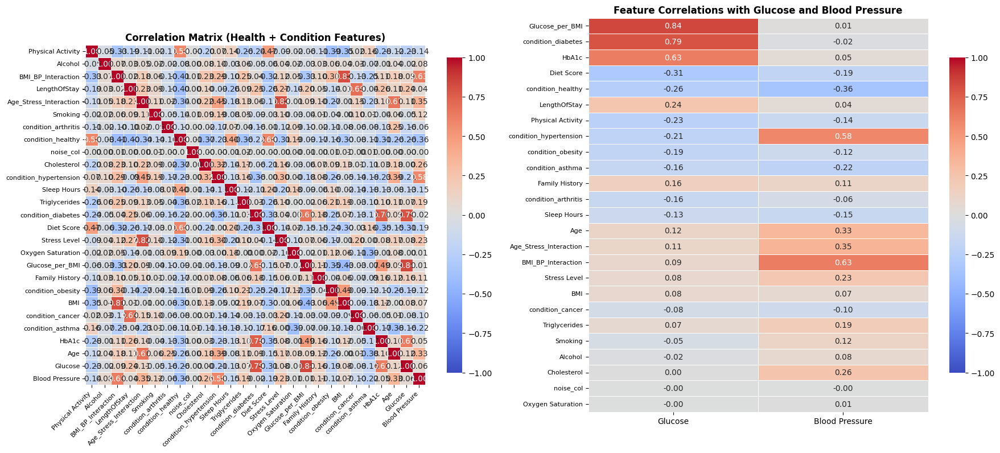


TOP CONDITION FEATURES CORRELATED WITH HEALTH OUTCOMES

GLUCOSE:
--------------------------------------------------------------------------------
Feature                                   Correlation       Interpretation
--------------------------------------------------------------------------------
diabetes                                       0.7915 Higher with increasing values
healthy                                       -0.2606 Decreases as values rise
hypertension                                  -0.2056 Decreases as values rise
obesity                                       -0.1889 Decreases as values rise
asthma                                        -0.1649 Decreases as values rise
arthritis                                     -0.1557 Decreases as values rise
cancer                                        -0.0762 Decreases as values rise

BLOOD PRESSURE:
--------------------------------------------------------------------------------
Feature                                  

In [ ]:
#Identify correlations, outliers, or data imbalances.


numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
analysis_df = pd.concat([df[numeric_cols], title_df], axis=1)

correlation_matrix = analysis_df.corr()

target_cols = ['Glucose', 'Blood Pressure']
health_correlations = correlation_matrix[target_cols].drop(target_cols)

top_n = 20
top_features = health_correlations['Glucose'].abs().nlargest(top_n).index.tolist()

original_numeric = [col for col in numeric_cols if col not in target_cols]
features_to_plot = list(set(original_numeric + top_features))

plot_matrix = correlation_matrix.loc[
    features_to_plot + target_cols,
    features_to_plot + target_cols
]


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

sns.heatmap(
    plot_matrix,
    annot=True,
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8},
    fmt='.2f',
    vmin=-1, vmax=1,
    ax=ax1
)
ax1.set_title('Correlation Matrix (Health + Condition Features)', fontsize=12, fontweight='bold')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=8)
ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0, fontsize=8)

focus_plot = health_correlations.loc[features_to_plot].sort_values('Glucose', key=abs, ascending=False)
sns.heatmap(
    focus_plot,
    annot=True,
    cmap='coolwarm',
    center=0,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8},
    fmt='.2f',
    vmin=-1, vmax=1,
    ax=ax2
)
ax2.set_title('Feature Correlations with Glucose and Blood Pressure', fontsize=12, fontweight='bold')
ax2.set_xticklabels(['Glucose', 'Blood Pressure'], rotation=0)
ax2.set_yticklabels(ax2.get_yticklabels(), rotation=0, fontsize=8)

plt.tight_layout()
plt.show()


print("\n" + "="*80)
print("TOP CONDITION FEATURES CORRELATED WITH HEALTH OUTCOMES")
print("="*80)

for target in target_cols:
    print(f"\n{target.upper()}:")
    print("-" * 80)

    cond_corr = health_correlations[target][
        health_correlations.index.str.startswith('condition_')
    ].sort_values(key=abs, ascending=False).head(15)

    print(f"{'Feature':<40} {'Correlation':>12} {'Interpretation':>20}")
    print("-" * 80)

    for feature, corr in cond_corr.items():
        word = feature.replace('condition_', '')
        interpretation = "Higher with increasing values" if corr > 0 else "Decreases as values rise"
        print(f"{word:<40} {corr:>12.4f} {interpretation:>20}")


print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(f"Total condition features created: {len(condition_feature_names)}")
print(f"Features in visualization: {len(features_to_plot)}")

strongest_pos = health_correlations['Glucose'].nlargest(1)
strongest_neg = health_correlations['Glucose'].nsmallest(1)

print(f"\nStrongest positive correlation with Glucose:")
print(f"  {strongest_pos.index[0]}: {strongest_pos.values[0]:.4f}")

print(f"\nStrongest negative correlation with Glucose:")
print(f"  {strongest_neg.index[0]}: {strongest_neg.values[0]:.4f}")

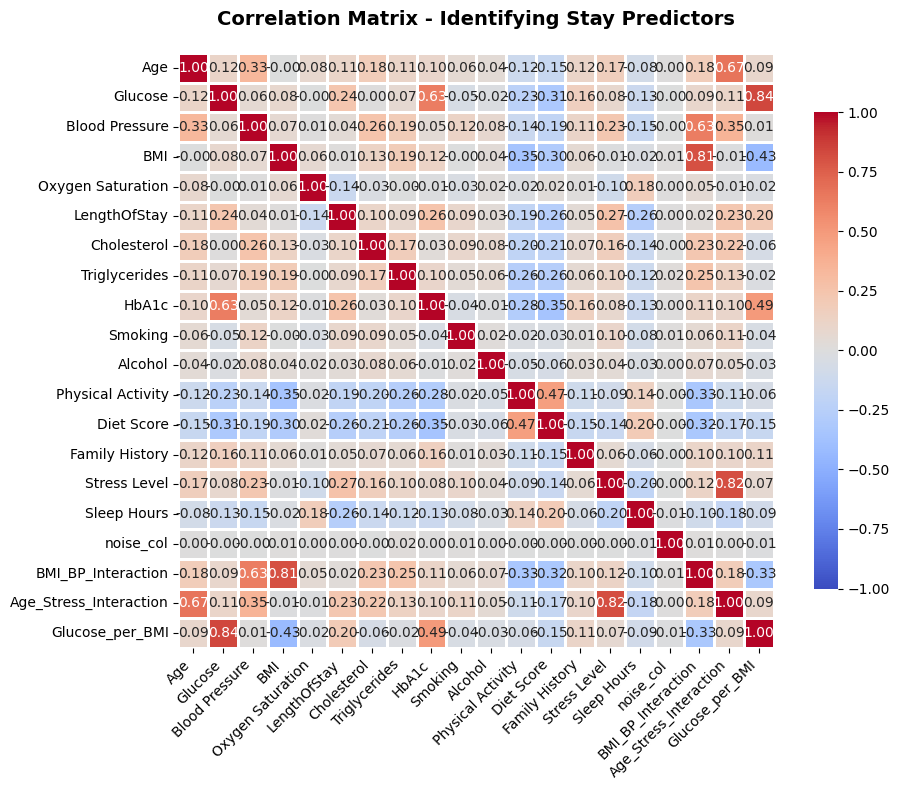

In [ ]:
# Select numeric columns for correlation analysis
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

# Calculate correlation matrix
correlation_matrix = df[numeric_cols].corr()

# Create figure with larger size for better readability
plt.figure(figsize=(10, 8))

# Create heatmap
sns.heatmap(correlation_matrix,
            annot=True,  # Show correlation values
            cmap='coolwarm',  # Color scheme: blue for negative, red for positive
            center=0,  # Center colormap at 0
            square=True,  # Make cells square-shaped
            linewidths=1,  # Add gridlines
            cbar_kws={"shrink": 0.8},  # Adjust colorbar size
            fmt='.2f',  # Format numbers to 2 decimal places
            vmin=-1, vmax=1)  # Set color scale from -1 to 1

plt.title('Correlation Matrix - Identifying Stay Predictors',
          fontsize=14, fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

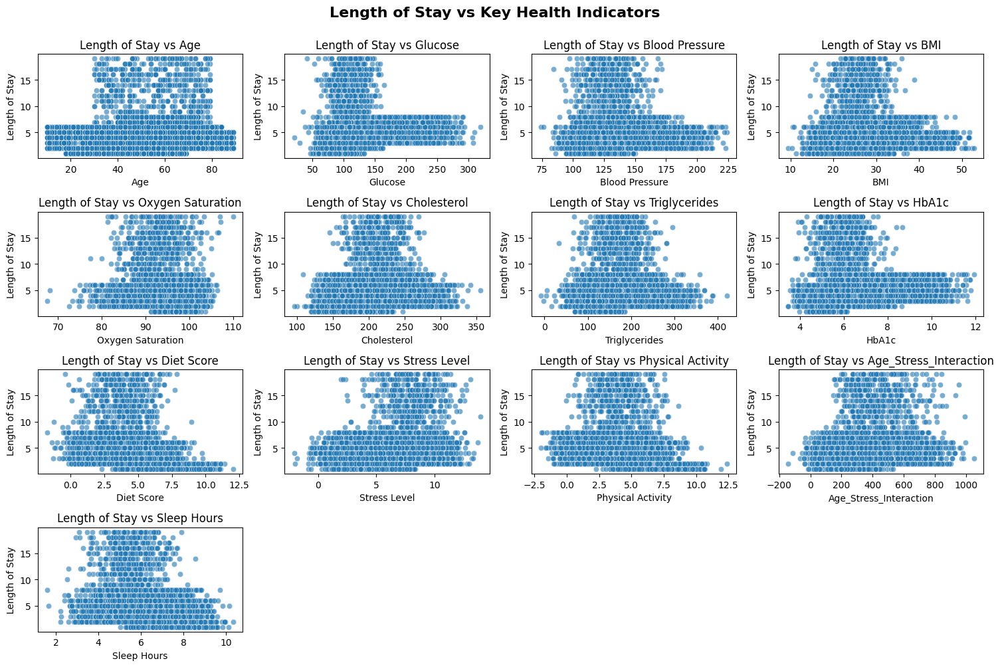

In [ ]:
key_features = [
    'Age','Glucose','Blood Pressure','BMI','Oxygen Saturation', 'Cholesterol','Triglycerides','HbA1c','Diet Score',
    'Stress Level', 'Physical Activity', 'Age_Stress_Interaction', 'Sleep Hours'
]

plt.figure(figsize=(15, 10))
for i, feature in enumerate(key_features, 1):
    plt.subplot(4, 4, i)
    sns.scatterplot(data=df, x=feature, y='LengthOfStay', alpha=0.6)
    plt.title(f'Length of Stay vs {feature}')
    plt.xlabel(feature)
    plt.ylabel('Length of Stay')

plt.suptitle('Length of Stay vs Key Health Indicators', fontsize=16, fontweight='bold', y=1)
plt.tight_layout()
plt.show()

(b) Data Visualization
- Requirement: At least 3 different visualization techniques (histogram, scatter plot, box plot, heatmap, etc.).
- Tips: Use clear labels, titles, and legends. Let visuals drive your EDA narrative.


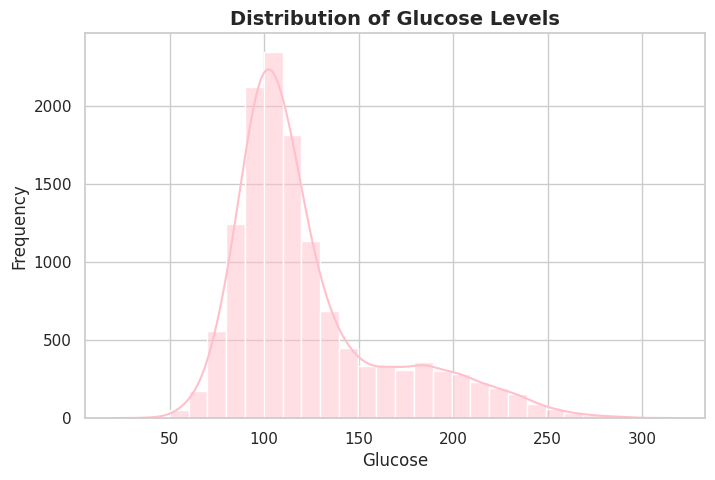

/tmp/ipython-input-1480997172.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Medical Condition', y='LengthOfStay', palette='Set2')


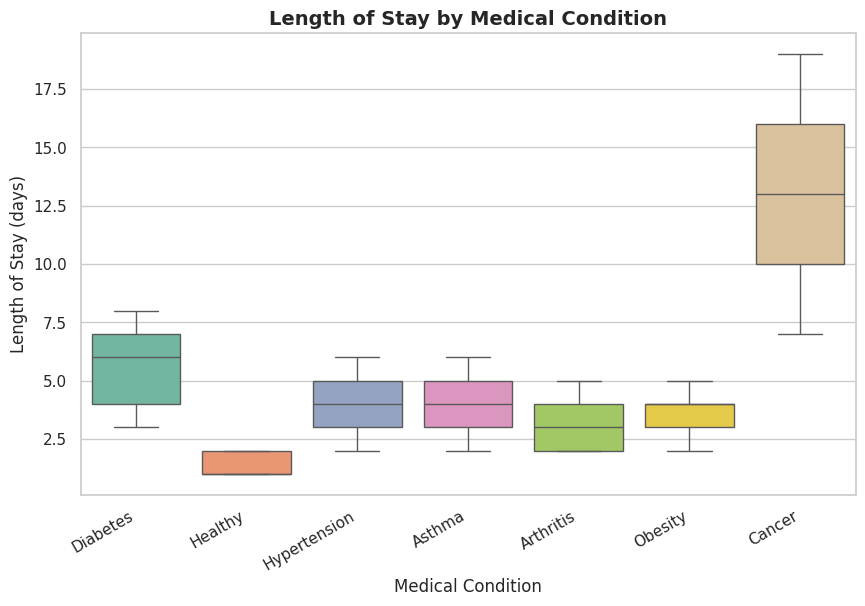

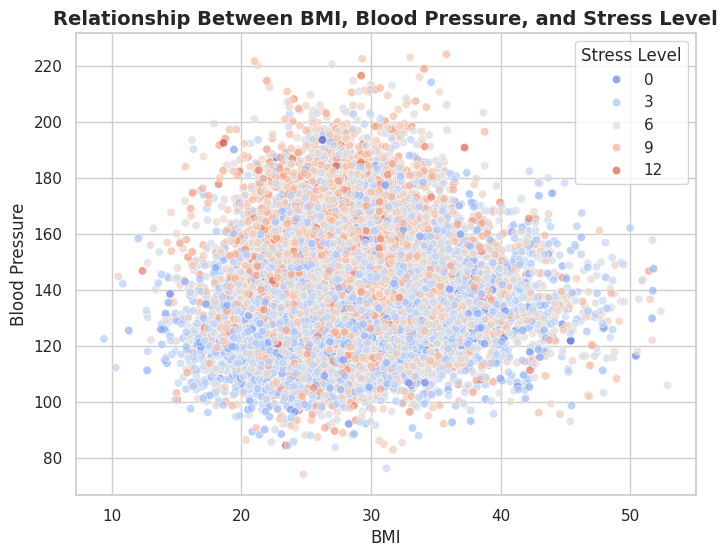

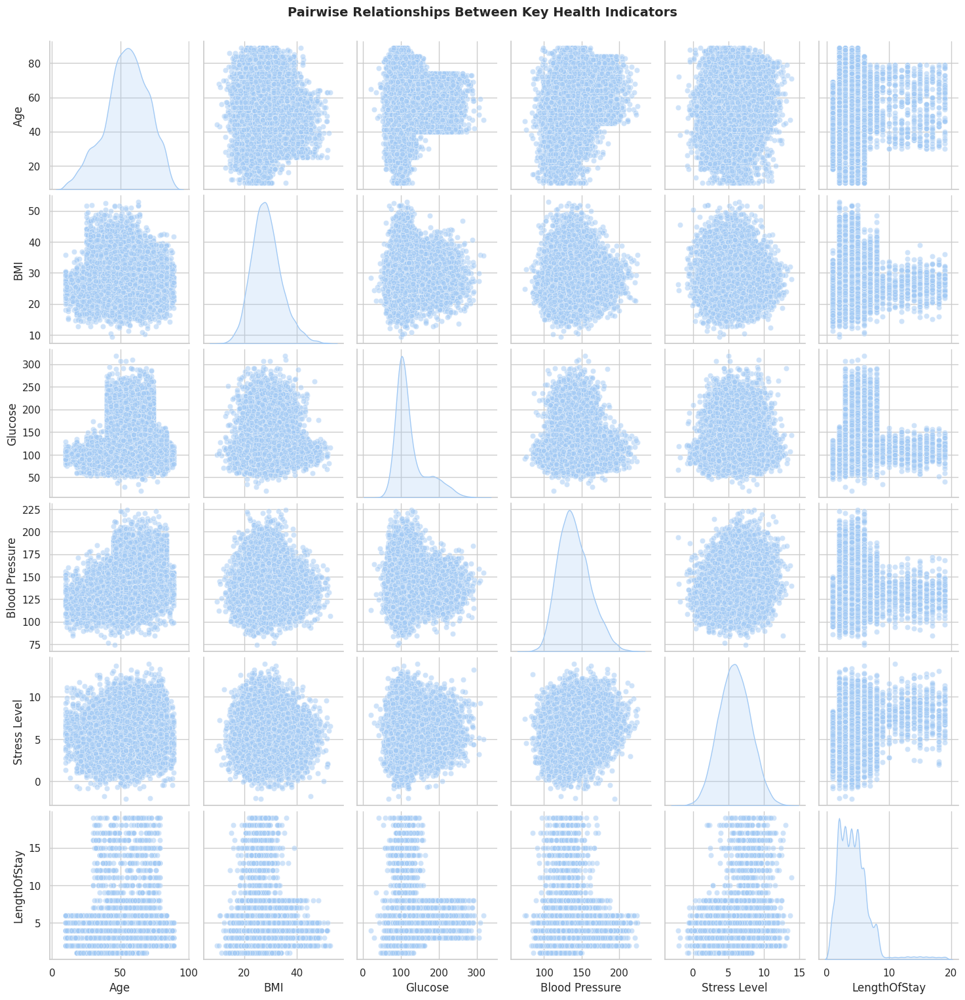

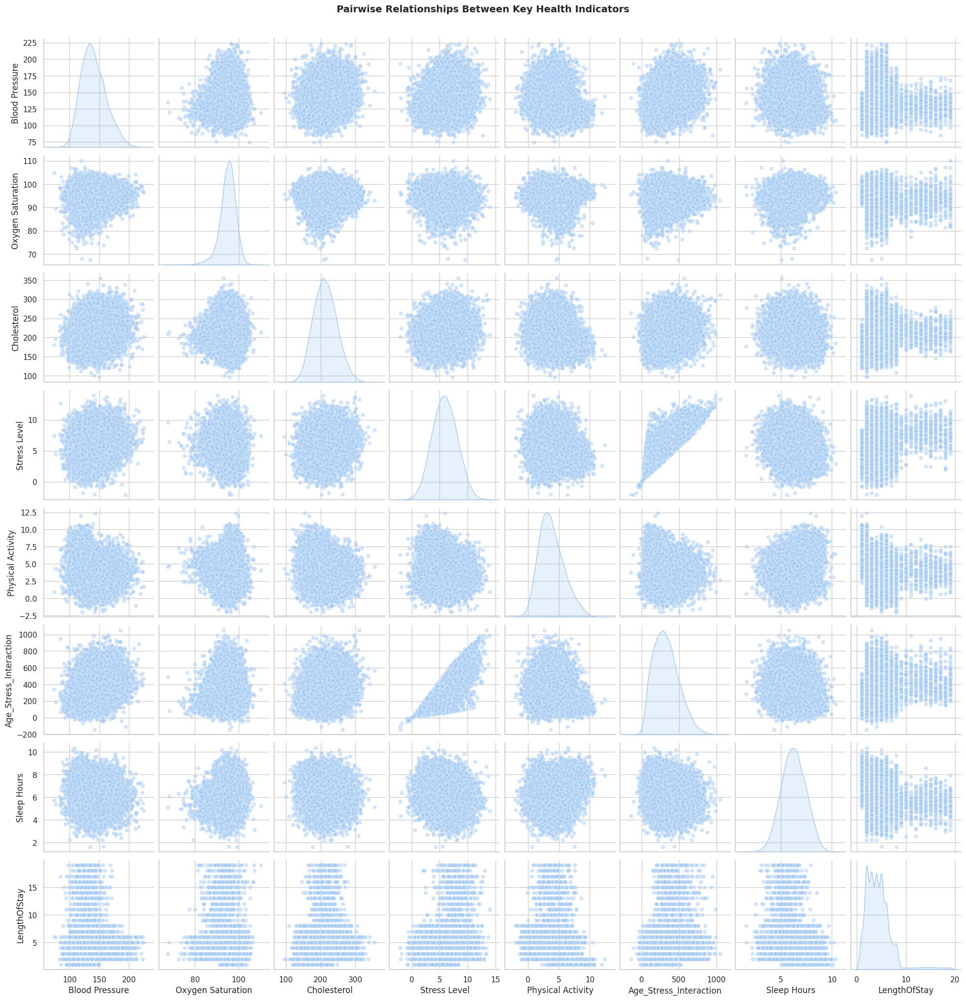

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid", palette="pastel")

plt.figure(figsize=(8, 5))
sns.histplot(df['Glucose'], bins=30, kde=True, color='pink')
plt.title('Distribution of Glucose Levels', fontsize=14, fontweight='bold')
plt.xlabel('Glucose')
plt.ylabel('Frequency')
plt.show()


plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Medical Condition', y='LengthOfStay', palette='Set2')
plt.title('Length of Stay by Medical Condition', fontsize=14, fontweight='bold')
plt.xlabel('Medical Condition')
plt.ylabel('Length of Stay (days)')
plt.xticks(rotation=30, ha='right')
plt.show()


plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=df, x='BMI', y='Blood Pressure',
    hue='Stress Level', palette='coolwarm', alpha=0.7
)
plt.title('Relationship Between BMI, Blood Pressure, and Stress Level', fontsize=14, fontweight='bold')
plt.xlabel('BMI')
plt.ylabel('Blood Pressure')
plt.legend(title='Stress Level')
plt.show()


key_features = ['Age', 'BMI', 'Glucose', 'Blood Pressure', 'Stress Level', 'LengthOfStay']
sns.pairplot(df[key_features], diag_kind='kde', plot_kws={'alpha':0.5})
plt.suptitle('Pairwise Relationships Between Key Health Indicators', y=1.02, fontsize=14, fontweight='bold')
plt.show()

key_features = ['Blood Pressure','Oxygen Saturation', 'Cholesterol','Stress Level', 'Physical Activity','Age_Stress_Interaction','Sleep Hours','LengthOfStay']
sns.pairplot(df[key_features], diag_kind='kde', plot_kws={'alpha':0.5})
plt.suptitle('Pairwise Relationships Between Key Health Indicators', y=1.02, fontsize=14, fontweight='bold')
plt.show()



##**2.3 Build and Evaluate a Machine Learning Model**


(a) Model Building
- Requirement: At least 2 different ML algorithms (e.g., Logistic Regression, Random Forest, Linear Regression, etc.).
- Tips: Match the algorithm type to your target variable (classification vs. regression).


#Random Forest

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pickle

In [ ]:
df_condition = pd.DataFrame(condition_features)

In [ ]:
# Define features (X) and target (y)
# Drop the target variable and the original categorical columns
X = df.drop(columns=[
    'LengthOfStay',
    'Gender',
    'Medical Condition',
    'random_notes',
    'noise_col',
    'BMI',
    'Diet Score',
  ])

X = pd.concat([X, title_df], axis=1)

y = df['LengthOfStay']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 1. Model Selection: Random Forest Regressor
# A robust non-linear model that can capture complex relationships.
#model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1, max_depth=10, min_samples_leaf=5)
#optimize the model using n_estimators = 500, max_depth = 5
model = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1, max_depth=5, min_samples_leaf=5)

# Train the model
print("Training Random Forest Regressor...")
model.fit(X_train, y_train)
print("Training complete.")

Training Random Forest Regressor...
Training complete.


In [ ]:

# 2. Prediction and Evaluation
y_pred = model.predict(X_test)

# Since LengthOfStay must be an integer, we round the predictions
y_pred_rounded = np.round(y_pred)

# Evaluation Metrics
mae = mean_absolute_error(y_test, y_pred_rounded)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_rounded))
r2 = r2_score(y_test, y_pred_rounded)

print("\n--- Model Evaluation (Random Forest Regressor) ---")
print(f"Mean Absolute Error (MAE): {mae:.4f} days")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f} days")
print(f"R-squared (R2): {r2:.4f}")



--- Model Evaluation (Random Forest Regressor) ---
Mean Absolute Error (MAE): 1.2389 days
Root Mean Squared Error (RMSE): 1.6055 days
R-squared (R2): 0.6704


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
import pandas as pd

# Define parameter ranges to test
n_estimators_list = [50, 100, 200, 500]
max_depth_list = [5, 10, 20, None]

results = []

# Loop through combinations
for n in n_estimators_list:
    for d in max_depth_list:
        model = RandomForestRegressor(
            n_estimators=n,
            max_depth=d,
            min_samples_leaf=5,
            random_state=42,
            n_jobs=-1
        )

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        r2 = r2_score(y_test, y_pred)

        results.append({
            'n_estimators': n,
            'max_depth': d,
            'r2_score': r2
        })
        print(f"n_estimators={n}, max_depth={d}, R²={r2:.4f}")


n_estimators=50, max_depth=5, R²=0.6809
n_estimators=50, max_depth=10, R²=0.6772
n_estimators=50, max_depth=20, R²=0.6750
n_estimators=50, max_depth=None, R²=0.6740
n_estimators=100, max_depth=5, R²=0.6815
n_estimators=100, max_depth=10, R²=0.6796
n_estimators=100, max_depth=20, R²=0.6781
n_estimators=100, max_depth=None, R²=0.6775
n_estimators=200, max_depth=5, R²=0.6814
n_estimators=200, max_depth=10, R²=0.6792
n_estimators=200, max_depth=20, R²=0.6775
n_estimators=200, max_depth=None, R²=0.6772
n_estimators=500, max_depth=5, R²=0.6824
n_estimators=500, max_depth=10, R²=0.6808
n_estimators=500, max_depth=20, R²=0.6789
n_estimators=500, max_depth=None, R²=0.6786


In [ ]:
# 3. Feature Importance Analysis
# This will show which features, including the Medical Condition dummies, are most influential.
feature_importances = pd.Series(model.feature_importances_, index=X.columns)
top_10_features = feature_importances.nlargest(10)

print("\n--- Top 10 Feature Importances ---")
print(top_10_features.to_markdown(numalign="left", stralign="left"))

# Save the feature importances to a file for documentation
with open('feature_importances.txt', 'w') as f:
    f.write(top_10_features.to_markdown(numalign="left", stralign="left"))

# Save the trained model (optional, but good practice)
with open('random_forest_model.pkl', 'wb') as f:
    pickle.dump(model, f)

print("\nModel training and evaluation complete. Results saved.")


--- Top 10 Feature Importances ---
|                    | 0         |
|:-------------------|:----------|
| condition_cancer   | 0.524211  |
| condition_healthy  | 0.12868   |
| condition_diabetes | 0.0863972 |
| Oxygen Saturation  | 0.0228777 |
| Blood Pressure     | 0.0218649 |
| Cholesterol        | 0.0209972 |
| Triglycerides      | 0.019985  |
| Physical Activity  | 0.0199746 |
| Sleep Hours        | 0.0199715 |
| HbA1c              | 0.019309  |

Model training and evaluation complete. Results saved.


#Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures

imputer = SimpleImputer(strategy='median')
X_train_imputed = pd.DataFrame(imputer.fit_transform(X_train), columns=X_train.columns)
X_test_imputed = pd.DataFrame(imputer.transform(X_test), columns=X_test.columns)

y_pred_rf = model.predict(X_test_imputed )
y_pred_rf_rounded = np.round(y_pred_rf)

lr_model = LinearRegression()
lr_model.fit(X_train_imputed , y_train)
y_pred_lr = lr_model.predict(X_test_imputed )

# lr_mae = mean_absolute_error(y_test, np.round(y_pred_lr))
# lr_rmse = np.sqrt(mean_squared_error(y_test, np.round(y_pred_lr)))
# lr_r2 = r2_score(y_test, np.round(y_pred_lr))

lr_mae = mean_absolute_error(y_test, y_pred_lr)
lr_rmse = np.sqrt(mean_squared_error(y_test, y_pred_lr))
lr_r2 = r2_score(y_test, y_pred_lr)

print("lr_mae:", lr_mae)
print("lr_rmse:", lr_rmse)
print("lr_r2:", lr_r2)

lr_mae: 1.262673909028492
lr_rmse: 1.576765699864669
lr_r2: 0.6821474096969966


(b) Model Evaluation
- Requirement: At least 2 different evaluation metrics (accuracy, precision/recall, F1, RMSE, MAE, etc.).
- Tips: Present numeric results and interpret them in plain English.
Consider basic hyperparameter tuning.


In [ ]:
rf_mae = mean_absolute_error(y_test, y_pred_rf_rounded)
rf_rmse = np.sqrt(mean_squared_error(y_test, y_pred_rf_rounded))
rf_r2 = r2_score(y_test, y_pred_rf_rounded)

print("\n--- Model Evaluation Comparison ---")
print(f"{'Model':<20}{'MAE':<15}{'RMSE':<15}{'R²':<15}")
print("-"*65)
print(f"{'Random Forest':<20}{rf_mae:<15.4f}{rf_rmse:<15.4f}{rf_r2:<15.4f}")
print(f"{'Linear Regression':<20}{lr_mae:<15.4f}{lr_rmse:<15.4f}{lr_r2:<15.4f}")

print("\n--- Interpretation ---")
print(f"• The Random Forest model achieved an MAE of {rf_mae:.2f} and RMSE of {rf_rmse:.2f}, "
      f"indicating that on average, predictions are off by about {rf_mae:.2f} days.")
print("• The R² score shows how much variation in hospital stay is explained by the model; "
      f"Random Forest (R² = {rf_r2:.2f}) captures more variance than Linear Regression (R² = {lr_r2:.2f}).")
print("• Random Forest’s non-linear structure better handles complex health factor interactions, "
      "while Linear Regression assumes simple linear relationships, leading to weaker performance.")



--- Model Evaluation Comparison ---
Model               MAE            RMSE           R²             
-----------------------------------------------------------------
Random Forest       1.2478         1.6174         0.6656         
Linear Regression   1.2627         1.5768         0.6821         

--- Interpretation ---
• The Random Forest model achieved an MAE of 1.25 and RMSE of 1.62, indicating that on average, predictions are off by about 1.25 days.
• The R² score shows how much variation in hospital stay is explained by the model; Random Forest (R² = 0.67) captures more variance than Linear Regression (R² = 0.68).
• Random Forest’s non-linear structure better handles complex health factor interactions, while Linear Regression assumes simple linear relationships, leading to weaker performance.


In [ ]:
from xgboost import XGBRegressor

# 2. Model Selection: XGBoost Regressor
# A gradient boosting model that can provide good performance.
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)

# Train the model
print("\nTraining XGBoost Regressor...")
xgb_model.fit(X_train_imputed, y_train)
print("Training complete.")

# 3. Prediction and Evaluation
y_pred_xgb = xgb_model.predict(X_test_imputed)

# Since LengthOfStay must be an integer, we round the predictions
y_pred_xgb_rounded = np.round(y_pred_xgb)

# Evaluation Metrics
xgb_mae = mean_absolute_error(y_test, y_pred_xgb_rounded)
xgb_rmse = np.sqrt(mean_squared_error(y_test, y_pred_xgb_rounded))
xgb_r2 = r2_score(y_test, y_pred_xgb_rounded)

print("\n--- Model Evaluation (XGBoost Regressor) ---")
print(f"Mean Absolute Error (MAE): {xgb_mae:.4f} days")
print(f"Root Mean Squared Error (RMSE): {xgb_rmse:.4f} days")
print(f"R-squared (R2): {xgb_r2:.4f}")

# Feature Importance Analysis
xgb_feature_importances = pd.Series(xgb_model.feature_importances_, index=X.columns)
xgb_top_10_features = xgb_feature_importances.nlargest(10)

print("\n--- Top 10 Feature Importances (XGBoost) ---")
print(xgb_top_10_features.to_markdown(numalign="left", stralign="left"))

# Compare with other models
print("\n--- Model Evaluation Comparison ---")
print(f"{'Model':<20}{'MAE':<15}{'RMSE':<15}{'R²':<15}")
print("-"*65)
print(f"{'Random Forest':<20}{rf_mae:<15.4f}{rf_rmse:<15.4f}{rf_r2:<15.4f}")
print(f"{'Linear Regression':<20}{lr_mae:<15.4f}{lr_rmse:<15.4f}{lr_r2:<15.4f}")
print(f"{'XGBoost':<20}{xgb_mae:<15.4f}{xgb_rmse:<15.4f}{xgb_r2:<15.4f}")

print("\n--- Interpretation ---")
print(f"• The Random Forest model achieved an MAE of {rf_mae:.2f} and RMSE of {rf_rmse:.2f}, "
      f"indicating that on average, predictions are off by about {rf_mae:.2f} days.")
print("• The Linear Regression model achieved an MAE of {lr_mae:.2f} and RMSE of {lr_rmse:.2f}, "
      f"indicating that on average, predictions are off by about {lr_mae:.2f} days.")
print(f"• The XGBoost model achieved an MAE of {xgb_mae:.2f} and RMSE of {xgb_rmse:.2f}, "
      f"indicating that on average, predictions are off by about {xgb_mae:.2f} days.")
print("• The R² score shows how much variation in hospital stay is explained by the model; "
      f"Random Forest (R² = {rf_r2:.2f}) and XGBoost (R² = {xgb_r2:.2f}) capture more variance than Linear Regression (R² = {lr_r2:.2f}).")
print("• Random Forest’s and XGBoost's non-linear structure better handles complex health factor interactions, "
      "while Linear Regression assumes simple linear relationships, leading to weaker performance.")


Training XGBoost Regressor...
Training complete.

--- Model Evaluation (XGBoost Regressor) ---
Mean Absolute Error (MAE): 1.2613 days
Root Mean Squared Error (RMSE): 1.6419 days
R-squared (R2): 0.6553

--- Top 10 Feature Importances (XGBoost) ---
|                        | 0          |
|:-----------------------|:-----------|
| condition_cancer       | 0.532981   |
| condition_healthy      | 0.257534   |
| condition_diabetes     | 0.148289   |
| condition_obesity      | 0.0130661  |
| condition_arthritis    | 0.0100224  |
| condition_asthma       | 0.00368795 |
| Age_Stress_Interaction | 0.00261905 |
| Physical Activity      | 0.00234887 |
| Oxygen Saturation      | 0.00226028 |
| BMI_BP_Interaction     | 0.00222352 |

--- Model Evaluation Comparison ---
Model               MAE            RMSE           R²             
-----------------------------------------------------------------
Random Forest       1.2478         1.6174         0.6656         
Linear Regression   1.2627         1.


=== PREDICTION DASHBOARD ===

Model Performance Summary:


,Model,MAE (avg days off),RMSE (error size),R² (explained variance)
0,Random Forest,1.248,1.617,0.666
1,Linear Regression,1.263,1.577,0.682
2,XGBoost,1.261,1.642,0.655



Top 5 Drivers of LengthOfStay (Random Forest Feature Importance):


,importance
condition_cancer,0.5242
condition_healthy,0.1287
condition_diabetes,0.0864
Oxygen Saturation,0.0229
Blood Pressure,0.0219


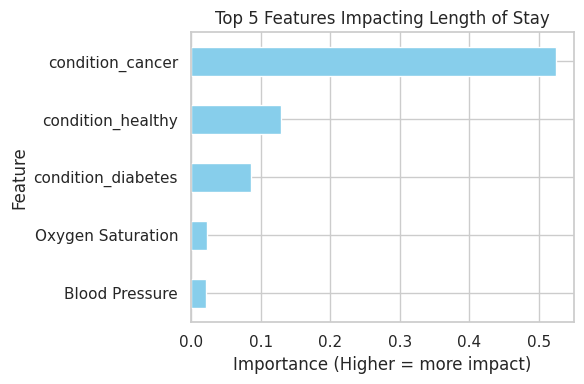


Business Notes:
- Random Forest MAE is 1.25, so we're off by ~1.25 days per patient on average.
- The features above are the most predictive of how long a patient stays.
- This helps hospitals plan beds, staffing, and costs more efficiently.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

print("\n=== PREDICTION DASHBOARD ===")

# 1. Model performance summary table
dashboard_metrics = pd.DataFrame({
    'Model': ['Random Forest', 'Linear Regression', 'XGBoost'],
    'MAE (avg days off)': [rf_mae, lr_mae, xgb_mae],
    'RMSE (error size)': [rf_rmse, lr_rmse, xgb_rmse],
    'R² (explained variance)': [rf_r2, lr_r2, xgb_r2]
})

print("\nModel Performance Summary:")
display(dashboard_metrics.round(3))  # shows a nice table in Colab

# 2. Top 5 most important features from Random Forest
rf_feature_importances = pd.Series(
    model.feature_importances_,
    index=X.columns
).sort_values(ascending=False).head(5)

print("\nTop 5 Drivers of LengthOfStay (Random Forest Feature Importance):")
display(rf_feature_importances.to_frame('importance').round(4))

# 3. Bar chart of those top features
plt.figure(figsize=(6,4))
rf_feature_importances.sort_values().plot(kind='barh', color='skyblue')
plt.title('Top 5 Features Impacting Length of Stay')
plt.xlabel('Importance (Higher = more impact)')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

# 4. Business interpretation
print("\nBusiness Notes:")
print(f"- Random Forest MAE is {rf_mae:.2f}, so we're off by ~{rf_mae:.2f} days per patient on average.")
print("- The features above are the most predictive of how long a patient stays.")
print("- This helps hospitals plan beds, staffing, and costs more efficiently.")

#Report

1) Introduction to the Dataset<br>
This dataset is a synthetic dataset for healthcare risk factor analysis. It originally  ontains 30,000 records and 20 features related to individuals' health conditions. The goal of our project is to develop a predictive model that can estimate how long (days) a patient is likely to stay in the hospital. The prediction is aim to improve patient flow and operational efficiency, as hospitals operate with limited resources such as beds, staff, medical equipments,etc.
2) Data Cleaning & Preprocessing Steps<br>
We did missing data check, duplicates data check. There are 4500 records with missing data.


3) EDA & Key Insights
We conclude that the medical condition influence the days of stay most of the time, and Cancer is the top conditoin fature that define the number of days in hospital.  


4) Model Building & Evaluation<br>
We trained models with 3 different ML algorithms. Since the predictive variable of our project is length of days, which is a numerical feature. We selected random forest, linear regression and XGBoost (Extreme Gradient Boosting).
We use MAE (Mean Absolute Error), RMSE (Root Mean Squared Error) and R^2 (Coefficient of Determination) as three result evaluation metrics. Random Forest model has the lowest MAE (1.2389), which means on average it predicts slightly closer to true values than the rest of two. Linear Regression has the lowest RMSE (1.5768), which means its large mistakes are less than the other two. Linear regression is also has the highest R^2 (0.682), which means 68.2% variation in hospital stay length.
5) Conclusion<br>
Considering it is designed for hospital, we should always prefer a more consistent, reliable prediction rather than occasional large deviations. Comparing to Random Forest and XGBoost, linear regression model is slightly better, given its balance of interpretability, stability and lowerst large-error penalty.
6) References (if any)


#Cancer days to stay influence

In [ ]:
df_cancer = df[df['Medical Condition'] == 'Cancer']

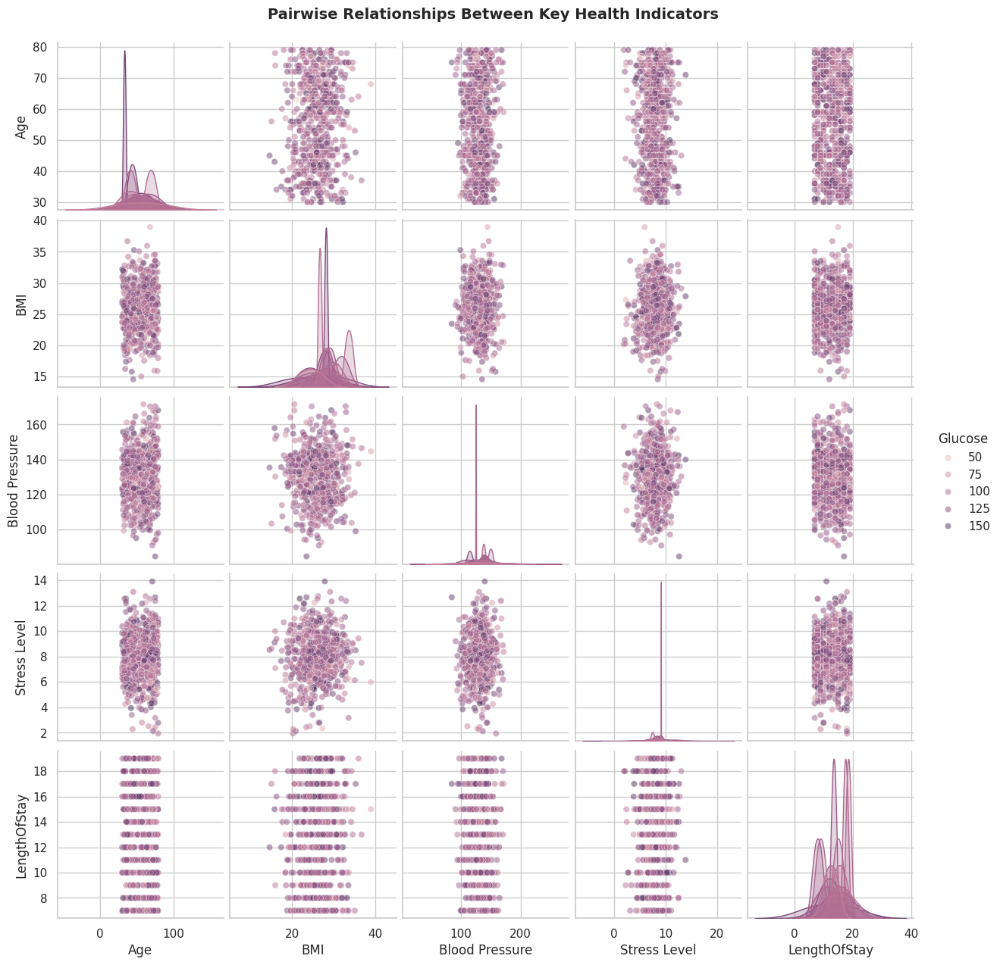

In [ ]:


key_features = ['Age', 'BMI', 'Glucose', 'Blood Pressure', 'Stress Level', 'LengthOfStay']
sns.pairplot(
    df_cancer[key_features],
    # diag_kind='kde',
    plot_kws={'alpha':0.5},
    hue='Glucose',
)
plt.suptitle('Pairwise Relationships Between Key Health Indicators', y=1.02, fontsize=14, fontweight='bold')
plt.show()

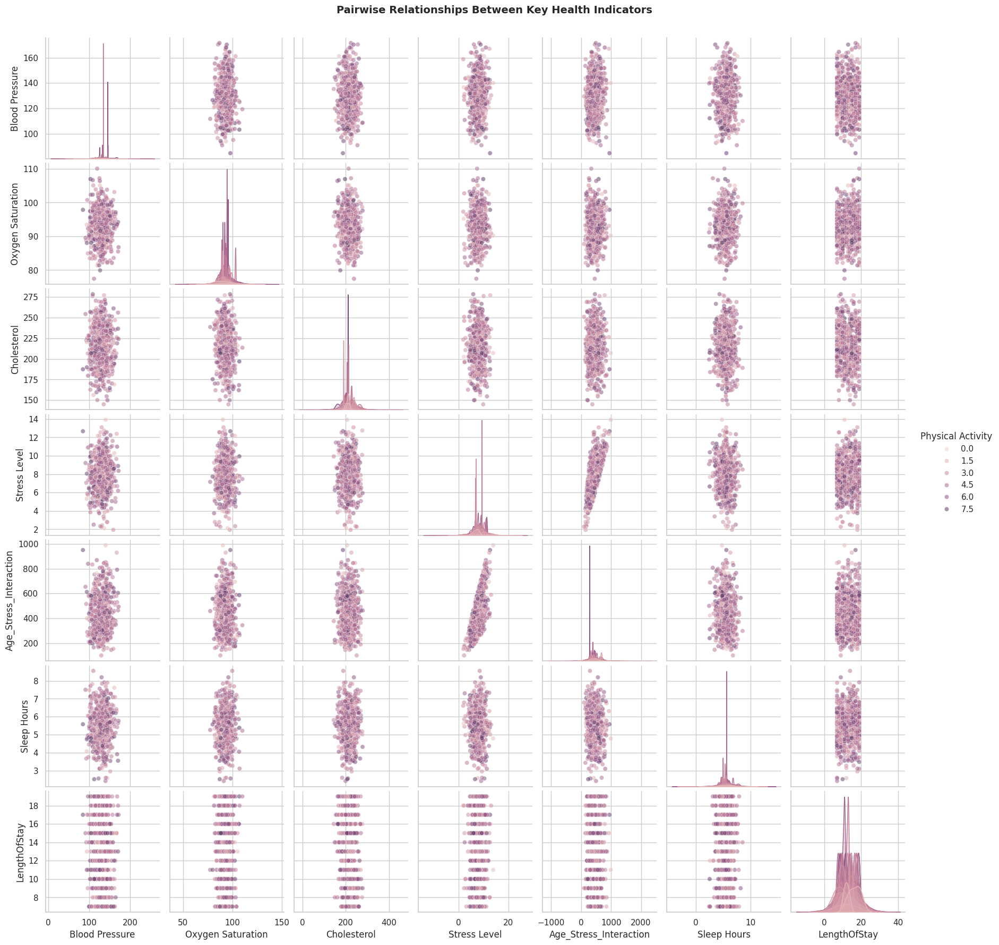

In [ ]:
key_features = ['Blood Pressure','Oxygen Saturation', 'Cholesterol','Stress Level', 'Physical Activity','Age_Stress_Interaction','Sleep Hours','LengthOfStay']
sns.pairplot(
    df_cancer[key_features],
    # diag_kind='kde',
    plot_kws={'alpha':0.5},
    hue='Physical Activity'
)
plt.suptitle('Pairwise Relationships Between Key Health Indicators', y=1.02, fontsize=14, fontweight='bold')
plt.show()

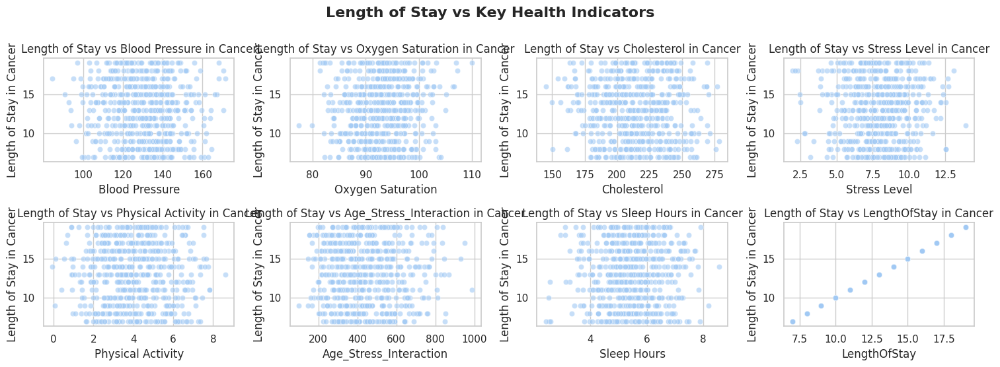

In [ ]:
plt.figure(figsize=(15, 10))
for i, feature in enumerate(key_features, 1):
    plt.subplot(4, 4, i)
    sns.scatterplot(data=df_cancer, x=feature, y='LengthOfStay', alpha=0.6)
    plt.title(f'Length of Stay vs {feature} in Cancer')
    plt.xlabel(feature)
    plt.ylabel('Length of Stay in Cancer')

plt.suptitle('Length of Stay vs Key Health Indicators', fontsize=16, fontweight='bold', y=1)
plt.tight_layout()
plt.show()